In [2]:
import mne
import numpy as np 
import pandas as pd 
import os
from tqdm import tqdm
import glob
from matplotlib import pyplot as plt

In [3]:
_dfs_list = []
for csv_filename in tqdm(glob.glob('./alchoholdataset/SMNI_CMI_TRAIN/*.csv')):
    _dfs_list.append(pd.read_csv(csv_filename))
df = pd.concat(_dfs_list)
del(_dfs_list)
df = df.drop(['Unnamed: 0'], axis=1)
df.head(3)

100%|████████████████████████████████████████████████████████████████████████████████| 468/468 [00:06<00:00, 75.52it/s]


,trial number,sensor position,sample num,sensor value,subject identifier,matching condition,channel,name,time
0,0,FP1,0,-8.921,a,S1 obj,0,co2a0000364,0.000000
1,0,FP1,1,-8.433,a,S1 obj,0,co2a0000364,0.003906
2,0,FP1,2,-2.574,a,S1 obj,0,co2a0000364,0.007812


In [4]:
channel_list = list(set(df['sensor position']))
print(channel_list)
channel_list.sort()

channel_mapping = {
    'AFZ':'AFz', 
    'CPZ':'CPz', 
    'CZ':'Cz', 
    'FCZ':'FCz', 
    'FP1':'Fp1',
    'FP2':'Fp2', 
    'FPZ':'Fpz', 
    'FZ':'Fz', 
    'OZ':'Oz', 
    'POZ':'POz', 
    'PZ':'Pz',
}
channel_mapping_full = dict()

for ch in channel_list:
    if ch in channel_mapping:
        channel_mapping_full[ch] = channel_mapping[ch]
    else:
        channel_mapping_full[ch] = ch

channel_list_fixed = [channel_mapping_full[ch] for ch in channel_list]
        
df['sensor position'] = df['sensor position'].map(channel_mapping_full)
df.head(3)

['FC4', 'P5', 'C1', 'FT8', 'P7', 'P8', 'FPZ', 'OZ', 'F1', 'FP2', 'CZ', 'C4', 'FC1', 'T7', 'TP7', 'O1', 'P4', 'O2', 'PO2', 'F4', 'CPZ', 'AF8', 'FC5', 'P6', 'AF7', 'F3', 'FP1', 'C3', 'FT7', 'FC3', 'CP6', 'FZ', 'POZ', 'F2', 'CP2', 'F7', 'F5', 'X', 'CP4', 'CP5', 'P3', 'P2', 'CP1', 'F6', 'AFZ', 'nd', 'PO8', 'FCZ', 'Y', 'TP8', 'FC2', 'C6', 'F8', 'C5', 'C2', 'P1', 'AF1', 'PO7', 'T8', 'AF2', 'CP3', 'FC6', 'PZ', 'PO1']


,trial number,sensor position,sample num,sensor value,subject identifier,matching condition,channel,name,time
0,0,Fp1,0,-8.921,a,S1 obj,0,co2a0000364,0.000000
1,0,Fp1,1,-8.433,a,S1 obj,0,co2a0000364,0.003906
2,0,Fp1,2,-2.574,a,S1 obj,0,co2a0000364,0.007812


In [5]:
transposed_df_list = []

for group_df in tqdm(df.groupby(['name', 'trial number', 'matching condition', 'sensor position', 'subject identifier'])):
    _df = pd.DataFrame(group_df[1]['sensor value']).T
    _df.columns = [f'sample_{idx}' for idx in range(256)]
    _df['name'] = group_df[0][0]
    _df['trial number'] = group_df[0][1]
    _df['matching condition'] = group_df[0][2]
    _df['sensor position'] = group_df[0][3]
    _df['subject identifier'] = group_df[0][4]
    
    transposed_df_list.append(_df)
df = pd.concat(transposed_df_list)
df = df[[*df.columns[-5:],*df.columns[0:-5]]]
df = df.reset_index(drop=True)
df.head(3)

100%|██████████████████████████████████████████████████████████████████████████| 29952/29952 [00:29<00:00, 1020.31it/s]


,name,trial number,matching condition,sensor position,subject identifier,sample_0,sample_1,sample_2,sample_3,sample_4,...,sample_246,sample_247,sample_248,sample_249,sample_250,sample_251,sample_252,sample_253,sample_254,sample_255
0,co2a0000364,0,S1 obj,AF1,a,-2.146,-2.146,-1.658,-0.682,2.248,...,-1.658,0.295,2.736,4.201,3.713,1.272,-0.682,-0.193,3.225,7.619
1,co2a0000364,0,S1 obj,AF2,a,1.129,0.641,-0.336,-0.824,0.641,...,4.059,-0.336,-2.777,-0.824,3.571,5.035,4.059,2.106,1.617,4.059
2,co2a0000364,0,S1 obj,AF7,a,-16.856,-7.090,7.558,19.277,23.183,...,17.324,9.511,1.699,-2.207,-2.207,1.211,5.117,8.046,10.000,11.464


In [6]:
def get_record_df(df, name, trial_number, matching_condition, channel_list):
    df_record = df[df['name'].eq(name) & df['trial number'].eq(trial_number) & df['matching condition'].eq(matching_condition)].set_index(['sensor position']).loc[channel_list]
    return df_record

df_record = get_record_df(df, 'co2a0000364', 0, 'S1 obj', channel_list_fixed)
df_record

,name,trial number,matching condition,subject identifier,sample_0,sample_1,sample_2,sample_3,sample_4,sample_5,...,sample_246,sample_247,sample_248,sample_249,sample_250,sample_251,sample_252,sample_253,sample_254,sample_255
sensor position,,,,,,,,,,,,,,,,,,,,,
AF1,co2a0000364,0,S1 obj,a,-2.146,-2.146,-1.658,-0.682,2.248,5.178,...,-1.658,0.295,2.736,4.201,3.713,1.272,-0.682,-0.193,3.225,7.619
AF2,co2a0000364,0,S1 obj,a,1.129,0.641,-0.336,-0.824,0.641,3.571,...,4.059,-0.336,-2.777,-0.824,3.571,5.035,4.059,2.106,1.617,4.059
AF7,co2a0000364,0,S1 obj,a,-16.856,-7.090,7.558,19.277,23.183,18.789,...,17.324,9.511,1.699,-2.207,-2.207,1.211,5.117,8.046,10.000,11.464
AF8,co2a0000364,0,S1 obj,a,-10.020,-7.090,1.211,10.488,13.906,10.976,...,28.554,27.089,15.859,0.722,-10.020,-10.997,-2.696,9.511,18.789,21.230
AFz,co2a0000364,0,S1 obj,a,-0.987,-1.475,-0.987,-0.010,2.431,4.873,...,0.478,-0.498,-0.498,0.478,0.966,0.966,0.966,0.478,2.431,5.361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TP7,co2a0000364,0,S1 obj,a,-9.338,-12.268,-8.850,-1.526,4.822,7.263,...,19.958,14.587,3.357,-6.897,-9.827,-3.967,6.775,14.587,16.052,13.123
TP8,co2a0000364,0,S1 obj,a,-3.082,-4.059,-3.571,-1.129,2.777,6.195,...,2.777,2.289,0.824,0.336,1.312,3.265,4.242,2.777,-0.153,-2.594
X,co2a0000364,0,S1 obj,a,-5.269,-5.758,-2.828,1.567,5.961,9.379,...,19.145,18.168,16.215,13.774,10.844,8.891,8.891,11.820,17.680,23.539


In [12]:
def get_signal_array(df, name, trial_number, matching_condition, channel_list):
    df_record = get_record_df(df, name, trial_number, matching_condition, channel_list)
    return df_record.to_numpy()[:, 4:]

signal_array = get_signal_array(df, 'co2a0000364', 10, 'S1 obj', channel_list_fixed)
signal_array

array([[4.842, 3.866, 3.377, ..., 10.213, 15.096, 18.514],
       [5.656, 3.703, 0.773, ..., 11.515, 13.468, 14.933],
       [1.495, -0.458, 0.519, ..., 22.491, 21.515, 17.609],
       ...,
       [5.473, 3.52, 1.078, ..., 56.742, 58.207, 58.207],
       [12.248, 8.83, 3.947, ..., 5.412, 8.341, 7.853],
       [5.198, 4.222, 3.733, ..., 33.518, 33.518, 32.542]], dtype=object)

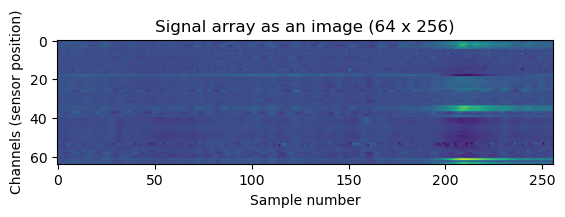

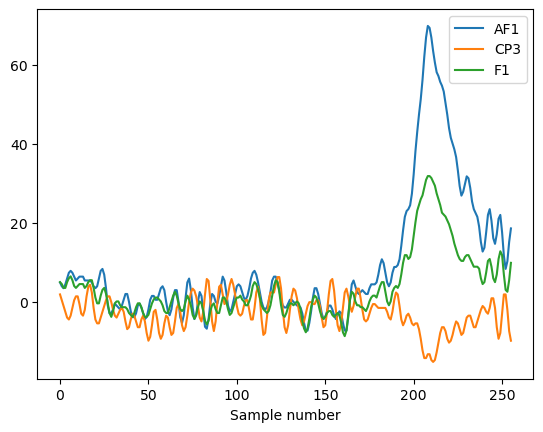

In [8]:
plt.title('Signal array as an image (64 x 256)')
plt.ylabel('Channels (sensor position)');
plt.xlabel('Sample number');
plt.imshow(signal_array.astype(int));
plt.show()

channels_to_display = ['AF1', 'CP3', 'F1']
for channel in channels_to_display:
    plt.xlabel('Sample number');
    plt.plot(signal_array[channel_list.index(channel)]);
plt.legend(channels_to_display);

In [11]:
print(channel_list_fixed, len(channel_list_fixed))
info = mne.create_info(ch_names=channel_list_fixed, sfreq=256, ch_types=['eeg']*64)
raw = mne.io.RawArray(signal_array, info)

standard_1020_montage = mne.channels.make_standard_montage('standard_1020');
raw.drop_channels(['X', 'Y', 'nd'])
raw.set_montage(standard_1020_montage)

['AF1', 'AF2', 'AF7', 'AF8', 'AFz', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'CP1', 'CP2', 'CP3', 'CP4', 'CP5', 'CP6', 'CPz', 'Cz', 'F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'FCz', 'Fp1', 'Fp2', 'Fpz', 'FT7', 'FT8', 'Fz', 'O1', 'O2', 'Oz', 'P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'PO1', 'PO2', 'PO7', 'PO8', 'POz', 'Pz', 'T7', 'T8', 'TP7', 'TP8', 'X', 'Y', 'nd'] 64
Creating RawArray with float64 data, n_channels=64, n_times=256
    Range : 0 ... 255 =      0.000 ...     0.996 secs
Ready.


<RawArray | 61 x 256 (1.0 s), ~208 kB, data loaded>

In [ ]:
info = mne.create_info(ch_names=channel_list_fixed, sfreq=256, ch_types=['eeg']*64)
raw = mne.io.RawArray(signal_array, info)

standard_1020_montage = mne.channels.make_standard_montage('standard_1020');
raw.drop_channels(['X', 'Y', 'nd'])
raw.set_montage(standard_1020_montage)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 1.000 (s)
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 1.000 (s)


C:\Users\Dedu\anaconda3\lib\site-packages\mne\viz\utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
C:\Users\Dedu\anaconda3\lib\site-packages\mne\viz\utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


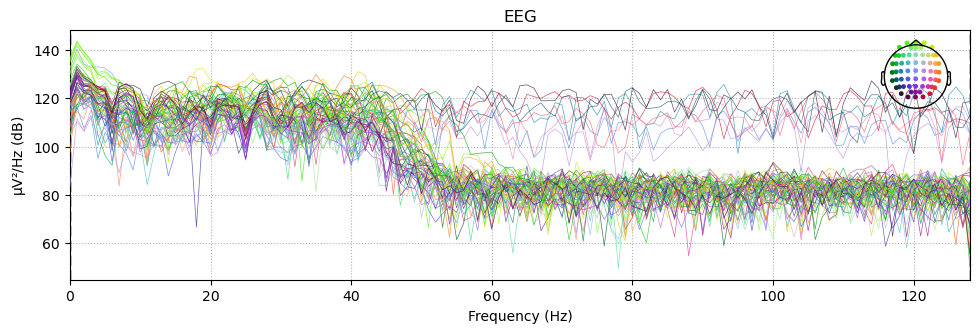

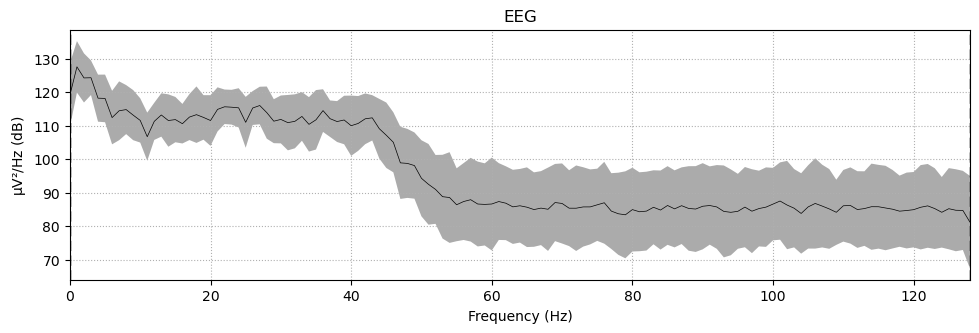

In [35]:
raw.plot_psd();
raw.plot_psd(average=True);

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 1.000 (s)
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 1.000 (s)


C:\Users\Dedu\AppData\Local\Temp\ipykernel_14588\2099550416.py:1: RuntimeWarning: filter_length (423) is longer than the signal (256), distortion is likely. Reduce filter length or filter a longer signal.
  raw_filtered = raw.copy().filter(8,30, verbose=False);
C:\Users\Dedu\anaconda3\lib\site-packages\mne\viz\utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
C:\Users\Dedu\anaconda3\lib\site-packages\mne\viz\utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


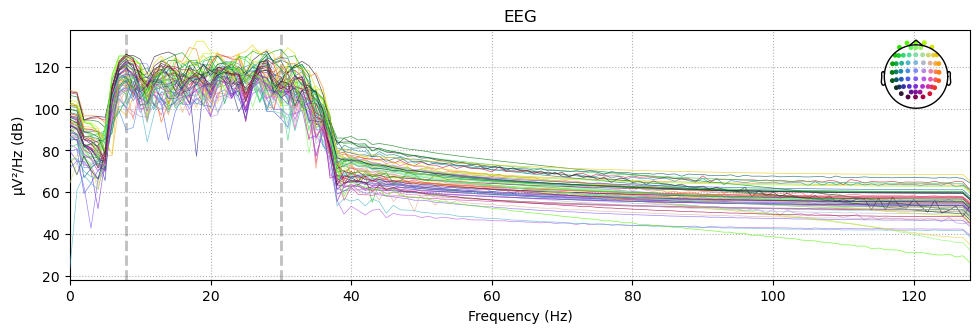

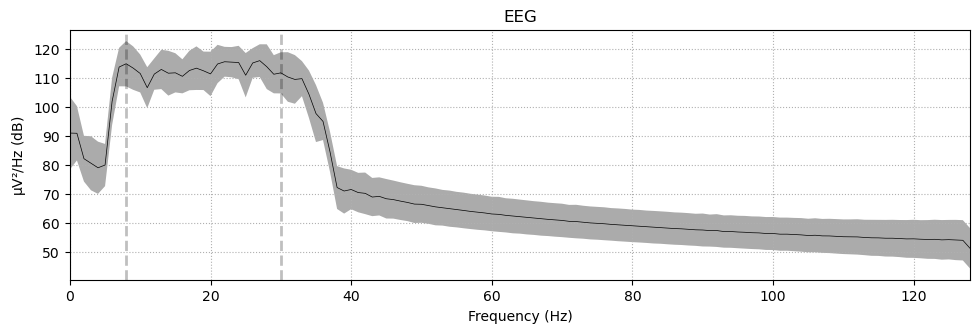

In [36]:
raw_filtered = raw.copy().filter(8,30, verbose=False);
raw_filtered.plot_psd();
raw_filtered.plot_psd(average=True);

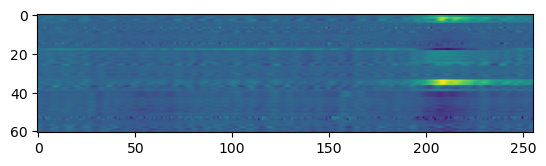

C:\Users\Dedu\AppData\Local\Temp\ipykernel_14588\3450553692.py:3: RuntimeWarning: filter_length (845) is longer than the signal (256), distortion is likely. Reduce filter length or filter a longer signal.
  plt.imshow(raw.copy().filter(1,10, verbose=False).get_data());


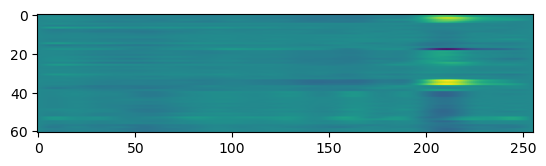

C:\Users\Dedu\AppData\Local\Temp\ipykernel_14588\3450553692.py:6: RuntimeWarning: filter_length (423) is longer than the signal (256), distortion is likely. Reduce filter length or filter a longer signal.
  plt.plot(raw.copy().filter(8,30, verbose=False).get_data()[40])


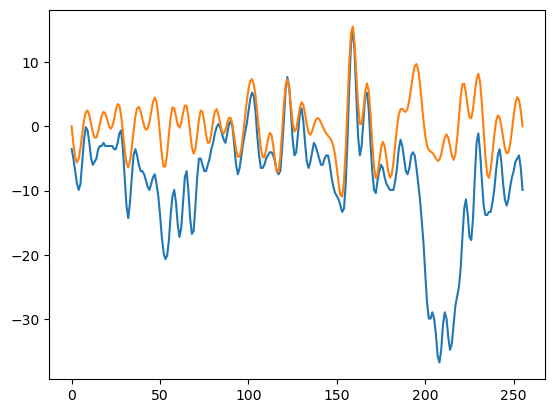

In [37]:
plt.imshow(raw.get_data())
plt.show()
plt.imshow(raw.copy().filter(1,10, verbose=False).get_data());
plt.show()
plt.plot(raw.copy().get_data()[40])
plt.plot(raw.copy().filter(8,30, verbose=False).get_data()[40])

C:\Users\Dedu\AppData\Local\Temp\ipykernel_14588\143292135.py:2: RuntimeWarning: filter_length (845) is longer than the signal (256), distortion is likely. Reduce filter length or filter a longer signal.
  ica.fit(raw.copy().filter(1,None, verbose=False), verbose=False)
C:\Users\Dedu\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:116: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


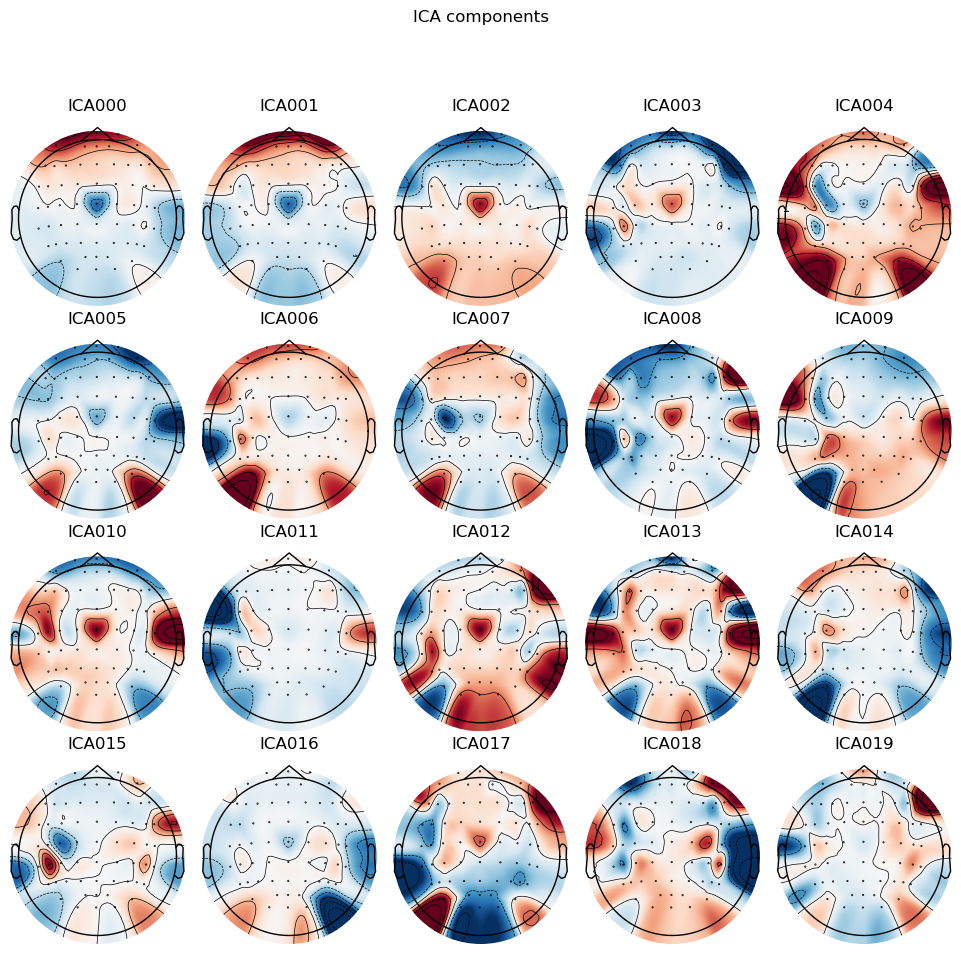

[<MNEFigure size 975x967 with 20 Axes>]

In [38]:
ica = mne.preprocessing.ICA(random_state=42, n_components=20)
ica.fit(raw.copy().filter(1,None, verbose=False), verbose=False)
ica.plot_components()


C:\Users\Dedu\AppData\Local\Temp\ipykernel_14588\4106416978.py:2: RuntimeWarning: filter_length (845) is longer than the signal (256), distortion is likely. Reduce filter length or filter a longer signal.
  ica.fit(raw.copy().filter(1,None, verbose=False), verbose=False)
C:\Users\Dedu\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:116: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


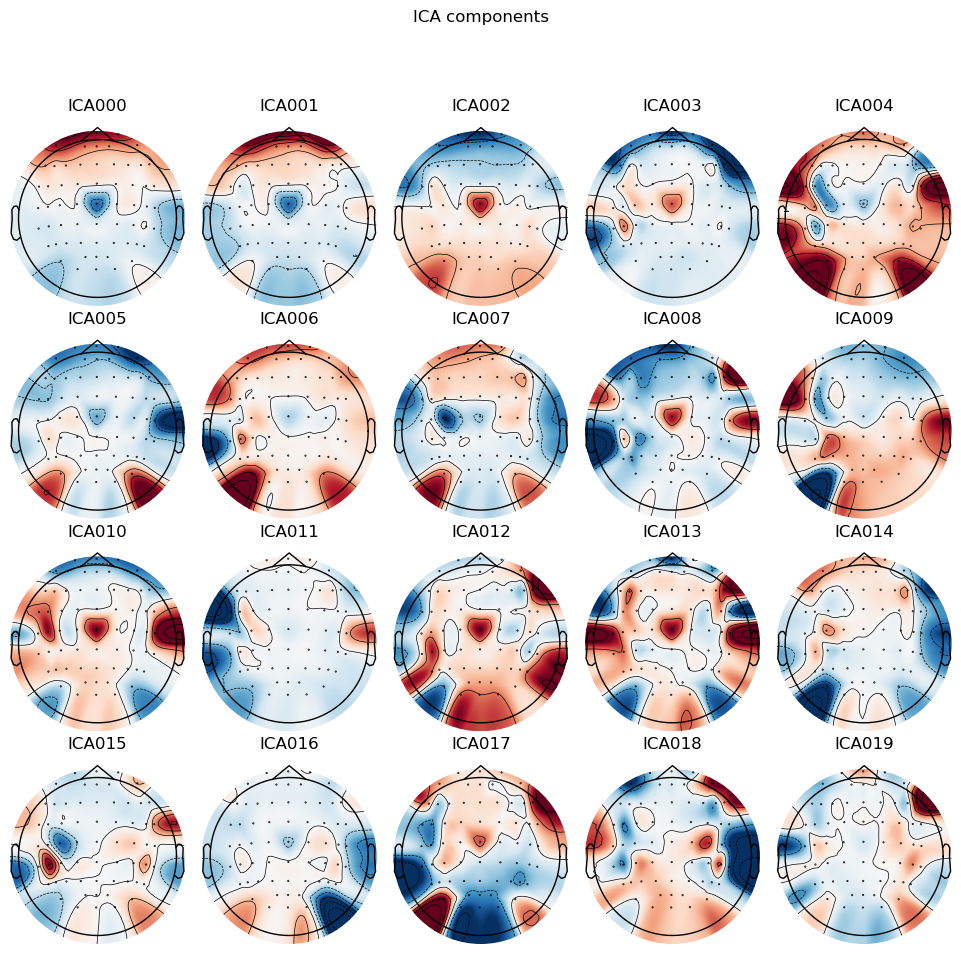

Component 0 has a large amplitude peak, possibly an eye blink
Component 1 has a large amplitude peak, possibly an eye blink
Component 2 has a large amplitude peak, possibly an eye blink
Component 3 has a large amplitude peak, possibly an eye blink
Component 4 has a large amplitude peak, possibly an eye blink
Component 5 has a large amplitude peak, possibly an eye blink
Component 6 has a large amplitude peak, possibly an eye blink
Component 7 has a large amplitude peak, possibly an eye blink
Component 11 has a large amplitude peak, possibly an eye blink
Component 14 has a large amplitude peak, possibly an eye blink
Component 15 has a large amplitude peak, possibly an eye blink
Component 16 has a large amplitude peak, possibly an eye blink
12


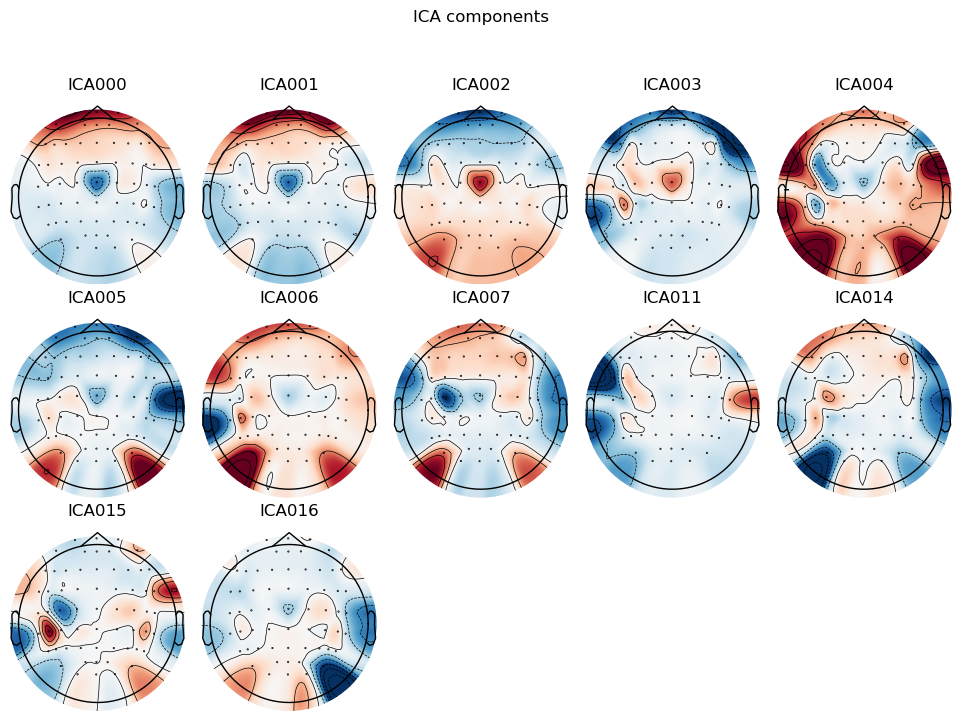

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 12 ICA components
    Projecting back using 61 PCA components
Creating RawArray with float64 data, n_channels=12, n_times=256
    Range : 0 ... 255 =      0.000 ...     0.996 secs
Ready.


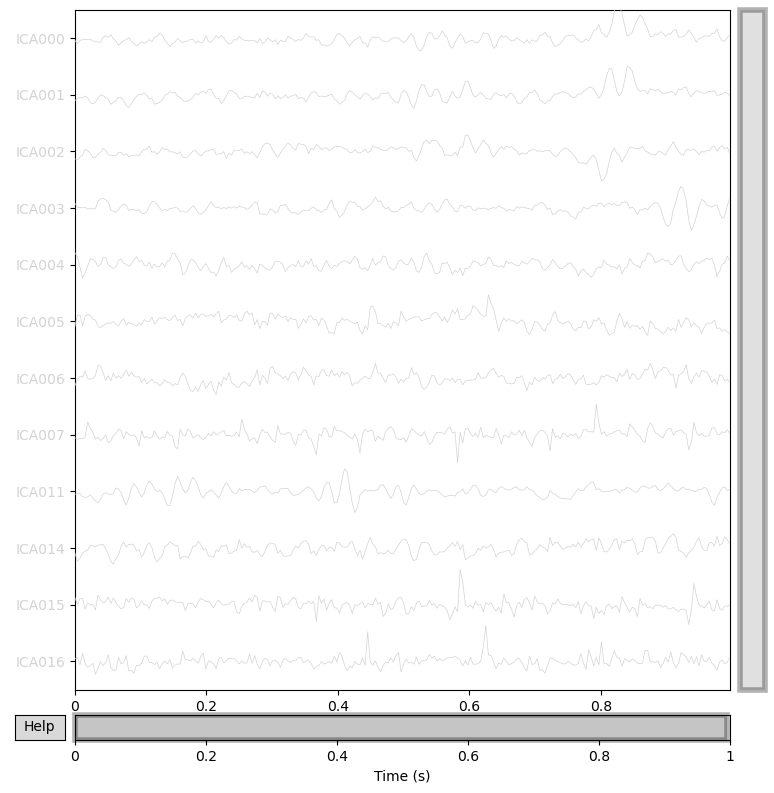

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 12 ICA components
    Projecting back using 61 PCA components


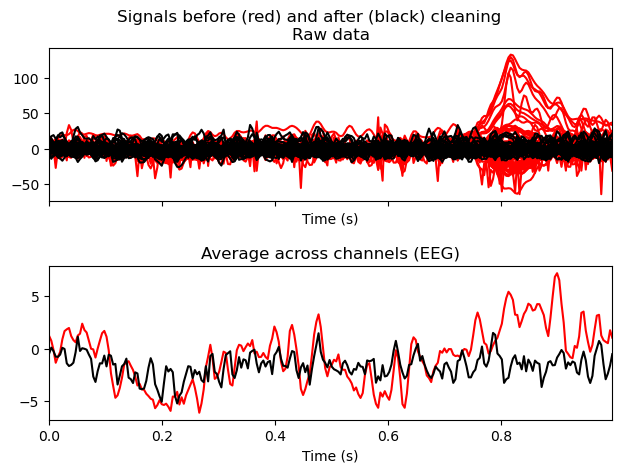

no of eye blink components 12


In [39]:
ica = mne.preprocessing.ICA(random_state=42, n_components=20)
ica.fit(raw.copy().filter(1,None, verbose=False), verbose=False)
ica.plot_components()

# Manually detect eye blinks
blink_indices = []
for i in range(ica.n_components_):
    component = ica.get_components()[:, i]
    amplitude = max(abs(component))
    #print(amplitude)
    if amplitude > 0.5:  # threshold for blink detection
        blink_indices.append(i)
        print('Component {} has a large amplitude peak, possibly an eye blink'.format(i))

# Plot the blink components
print(len(blink_indices))
ica.plot_components(blink_indices)


# Plot the raw data with the blink component removed
ica.exclude = blink_indices
raw_ica = raw.copy()
ica.apply(raw_ica)
ica.plot_sources(raw, blink_indices)
ica.plot_overlay(raw)
print("no of eye blink components",len(blink_indices))

In [40]:
def plot_eeg_topomap(signal_array, save_path_animation=None, show_names=False, start_time=0.05, end_time=1, step_size=0.1):
    # select channel X,Y format
    montage = mne.channels.make_standard_montage('standard_1020')
    
    # remove channels that don't have X,Y positions
    ch_to_remove = []
    for ch in channel_list_fixed:
        if ch not in list(set(montage.ch_names).intersection(channel_list_fixed)):
            ch_to_remove.append(channel_list_fixed.index(ch))
    arr = np.delete(signal_array.copy(), ch_to_remove, axis=0)
    
    # create info+evoked objects
    info = mne.create_info(ch_names=list(set(montage.ch_names).intersection(channel_list_fixed)), sfreq=256, ch_types='eeg')
    evoked = mne.EvokedArray(arr, info)
    
    # set channel X,Y positions
    evoked.set_montage(montage)
    # plot img
    evoked.plot_topomap(np.arange(start_time, end_time, step_size), ch_type='eeg', time_unit='s', ncols=5, nrows=2, show_names=show_names);

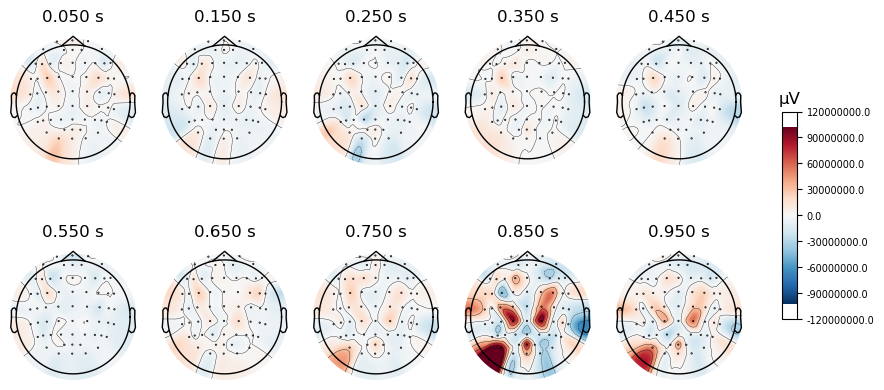

In [41]:
plot_eeg_topomap(signal_array, show_names=False)

In [42]:
def plot_eeg_topomap_animation(signal_array, save_path_animation, start_time=0.00, end_time=1, step_size=0.01, frame_rate=10):
    # select channel X,Y format
    montage = mne.channels.make_standard_montage('standard_1020')
    
    # remove channels that don't have X,Y positions
    ch_to_remove = []
    for ch in channel_list_fixed:
        if ch not in list(set(montage.ch_names).intersection(channel_list_fixed)):
            ch_to_remove.append(channel_list_fixed.index(ch))
    arr = np.delete(signal_array.copy(), ch_to_remove, axis=0)
    # create info+evoked objects
    info = mne.create_info(ch_names=list(set(montage.ch_names).intersection(channel_list_fixed)), sfreq=256, ch_types='eeg')
    evoked = mne.EvokedArray(arr, info)
    
    # set channel X,Y positions
    evoked.set_montage(montage)
    
    # (optional) plot and save animation
    if save_path_animation:
        fig, anim = evoked.animate_topomap(times=np.arange(start_time, end_time, step_size), frame_rate=frame_rate, butterfly=True, blit=False, );
        anim.save(save_path_animation);
        print('saved to', save_path_animation)

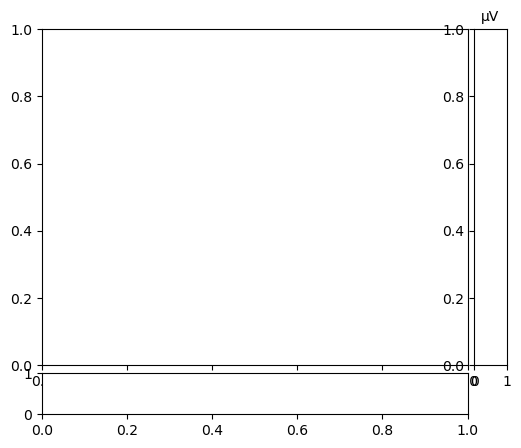

Initializing animation...
saved to ./gif.gif


In [43]:
%matplotlib inline
plot_eeg_topomap_animation(signal_array, './gif.gif')
#plt.rcParams['animation.writer'] = 'imagemagick'


No projector specified for this dataset. Please consider the method self.add_proj.


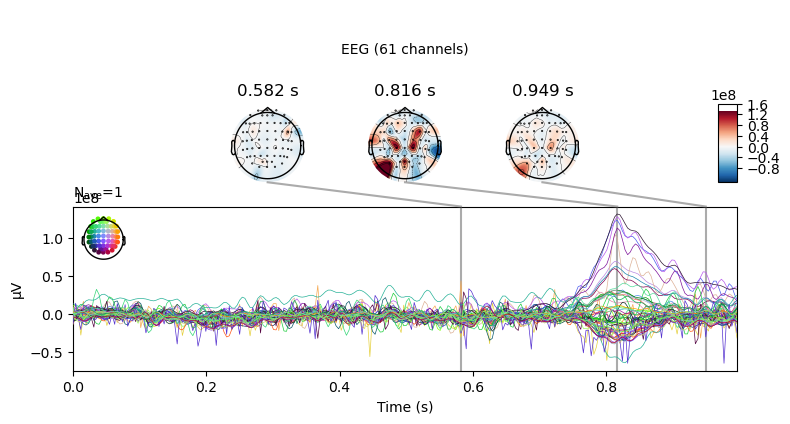

In [44]:
def plot_eeg_joint_topomap(signal_array, save_path_animation=None, show_names=False, start_time=0.05, end_time=1, step_size=0.1):
    # select channel X,Y format
    montage = mne.channels.make_standard_montage('standard_1020')
    
    # remove channels that don't have X,Y positions
    ch_to_remove = []
    for ch in channel_list_fixed:
        if ch not in list(set(montage.ch_names).intersection(channel_list_fixed)):
            ch_to_remove.append(channel_list_fixed.index(ch))
    arr = np.delete(signal_array.copy(), ch_to_remove, axis=0)
    
    # create info+evoked objects
    info = mne.create_info(ch_names=list(set(montage.ch_names).intersection(channel_list_fixed)), sfreq=256, ch_types='eeg')
    evoked = mne.EvokedArray(arr, info)
    
    # set channel X,Y positions
    evoked.set_montage(montage)

    # plot img
    evoked.plot_joint();
    
plot_eeg_joint_topomap(signal_array)

 For Band: Delta
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 4 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 4.00 Hz: -6.02, -6.02 dB

Effective window size : 1.000 (s)
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 0.0s.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\Dedu\AppData\Local\Temp\ipykernel_14588\1430947192.py:33: RuntimeWarning: Using n_components=20 (resulting in n_components_=20) may lead to an unstable mixing matrix estimation because the ratio between the largest (52) and smallest (2e-10) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 9
  ica.fit(raw_band)


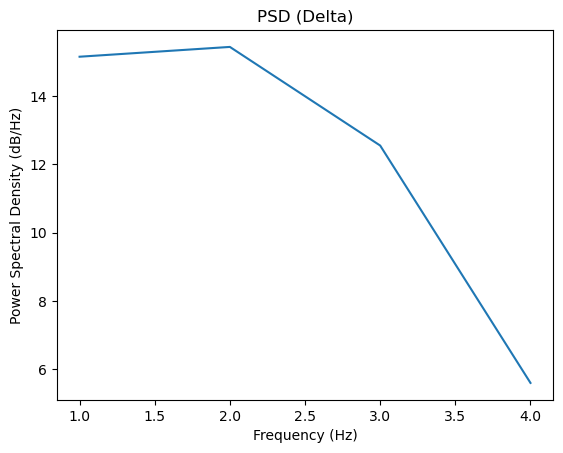

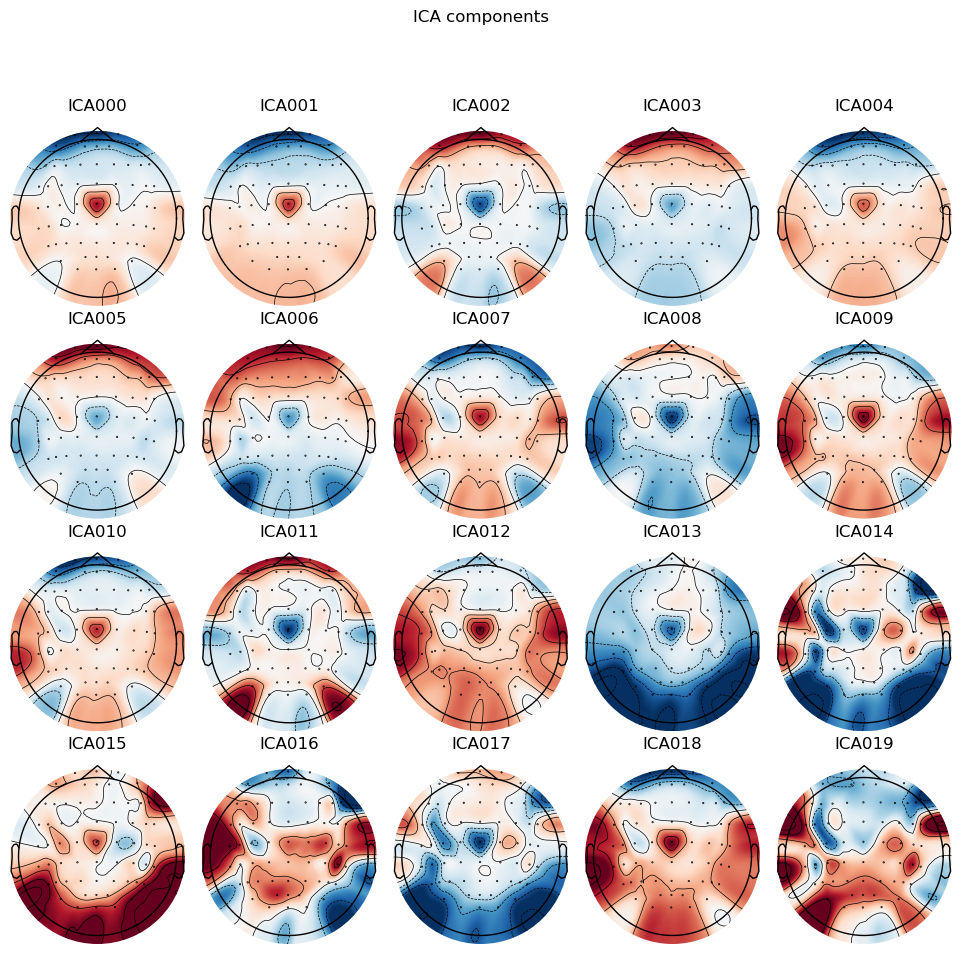

 For Band: Theta
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 8 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 4.00, 8.00 Hz: -6.02, -6.02 dB

Effective window size : 1.000 (s)
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 0.0s.


C:\Users\Dedu\AppData\Local\Temp\ipykernel_14588\1430947192.py:40: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=256).
  plt.specgram(raw_band.get_data()[0], Fs=raw_band.info['sfreq'])
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\Dedu\AppData\Local\Temp\ipykernel_14588\1430947192.py:33: RuntimeWarning: Using n_components=20 (resulting in n_components_=20) may lead to an unstable mixing matrix estimation because the ratio between the largest (55) and smallest (5.7e-08) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 13
  ica.fit(raw_band)


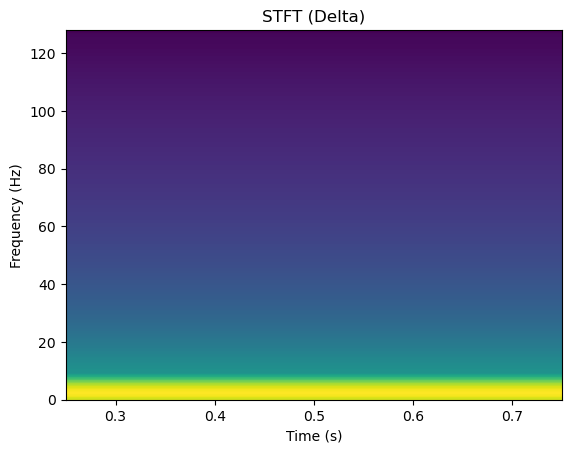

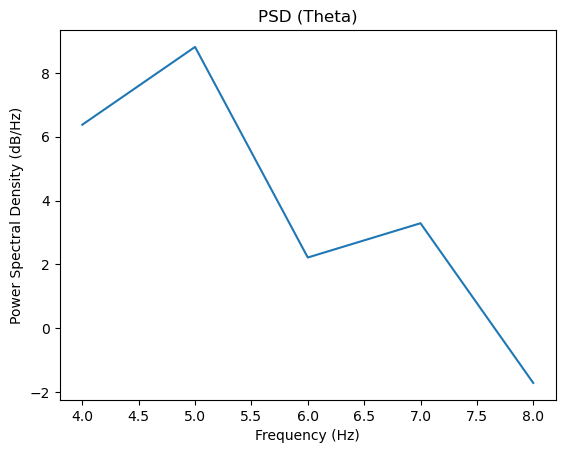

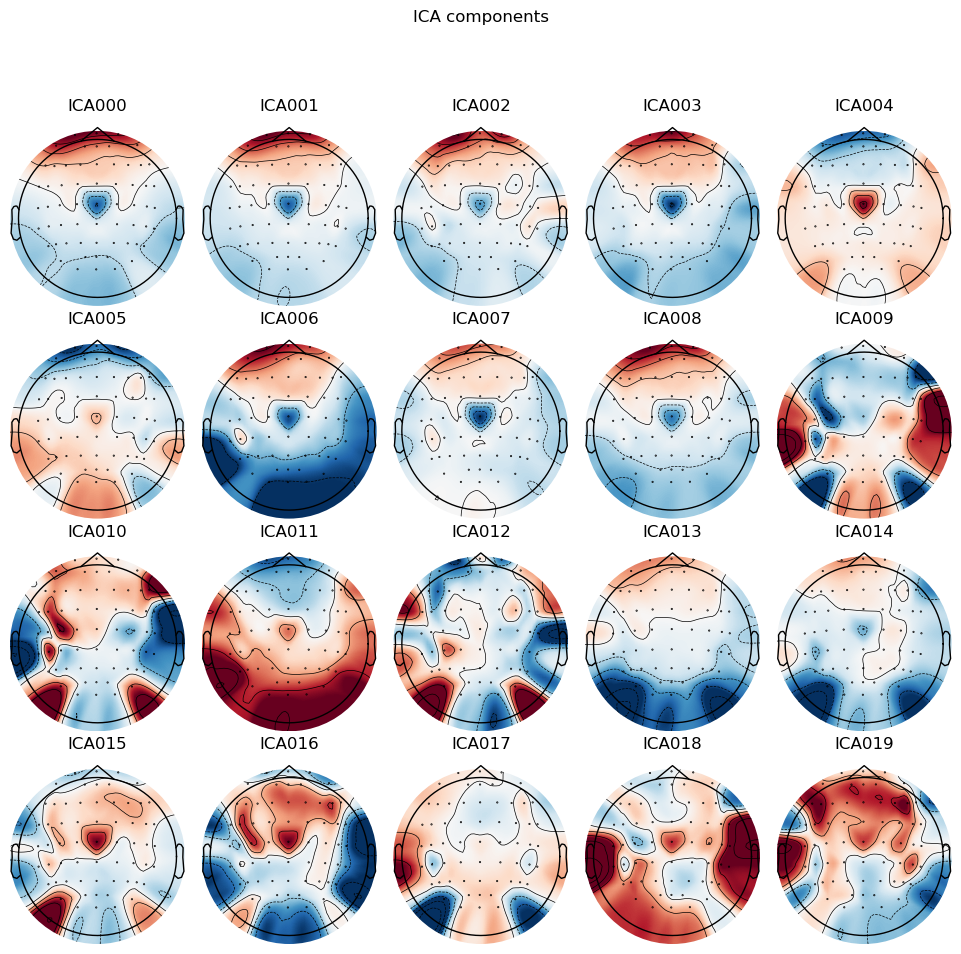

 For Band: Alpha
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 8 - 12 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 8.00, 12.00 Hz: -6.02, -6.02 dB

Effective window size : 1.000 (s)
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 0.0s.


C:\Users\Dedu\AppData\Local\Temp\ipykernel_14588\1430947192.py:40: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=256).
  plt.specgram(raw_band.get_data()[0], Fs=raw_band.info['sfreq'])
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\Dedu\AppData\Local\Temp\ipykernel_14588\1430947192.py:33: RuntimeWarning: Using n_components=20 (resulting in n_components_=20) may lead to an unstable mixing matrix estimation because the ratio between the largest (32) and smallest (6.8e-07) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 15
  ica.fit(raw_band)


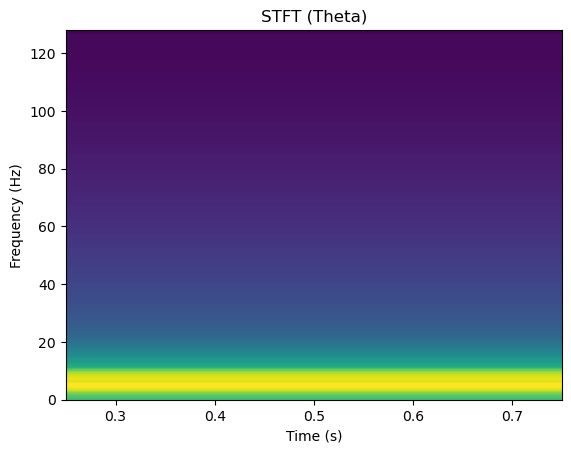

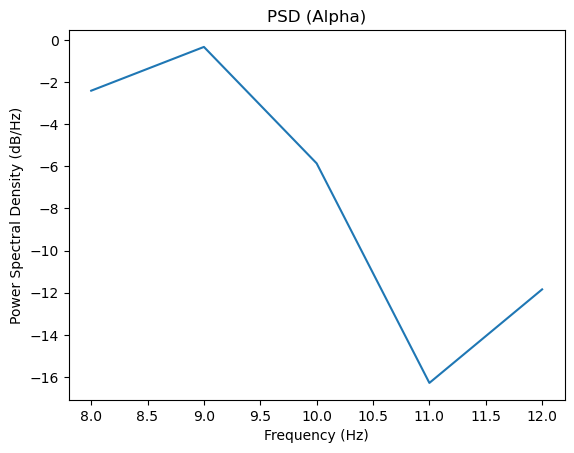

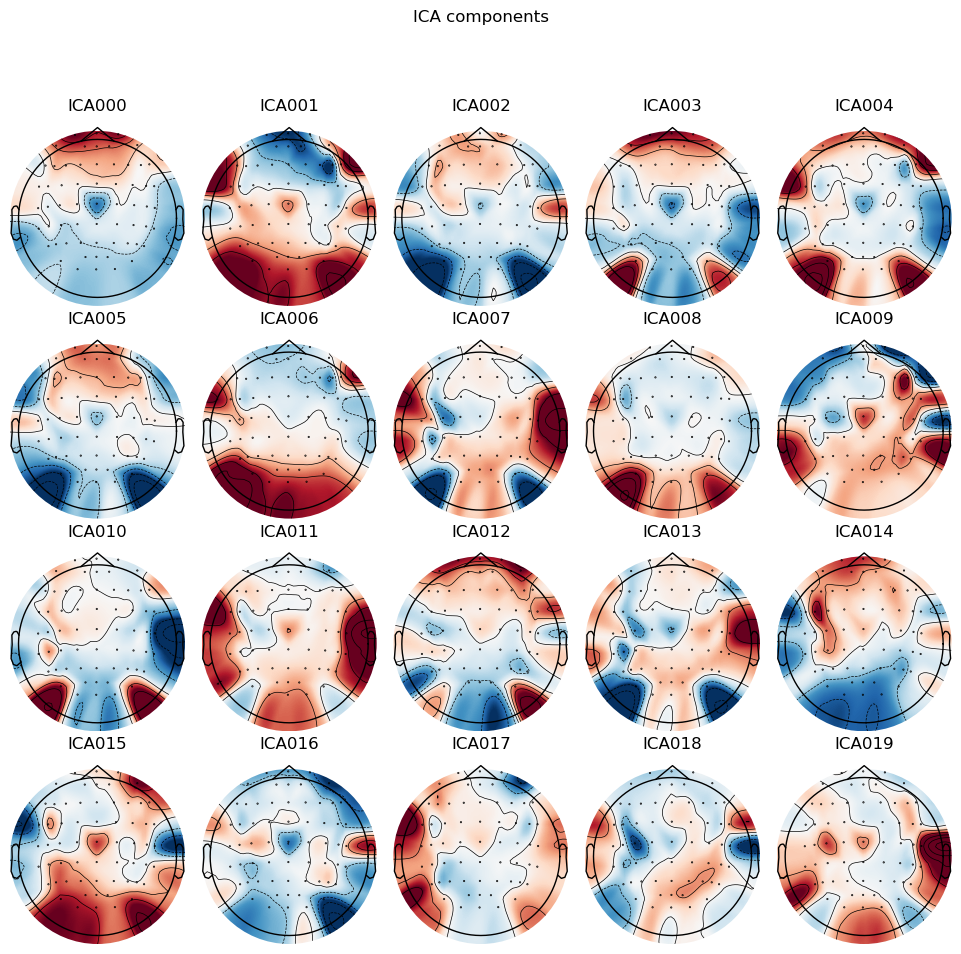

 For Band: Beta
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 12 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 12.00, 30.00 Hz: -6.02, -6.02 dB

Effective window size : 1.000 (s)
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 0.0s.


C:\Users\Dedu\AppData\Local\Temp\ipykernel_14588\1430947192.py:40: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=256).
  plt.specgram(raw_band.get_data()[0], Fs=raw_band.info['sfreq'])
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


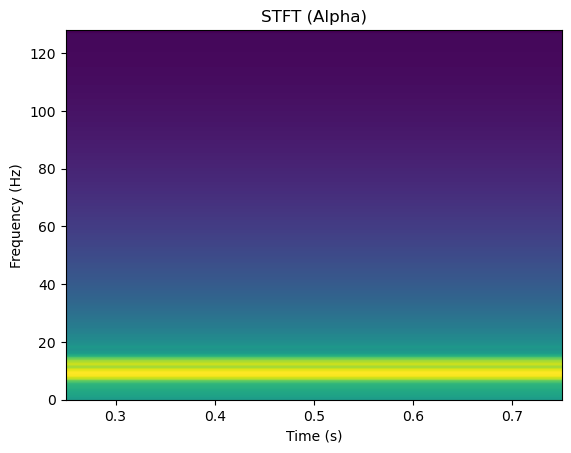

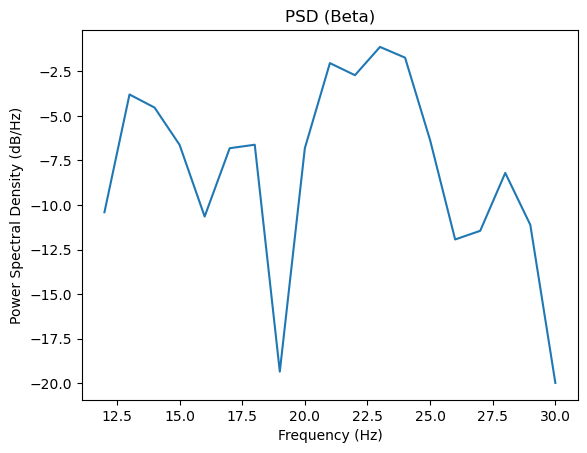

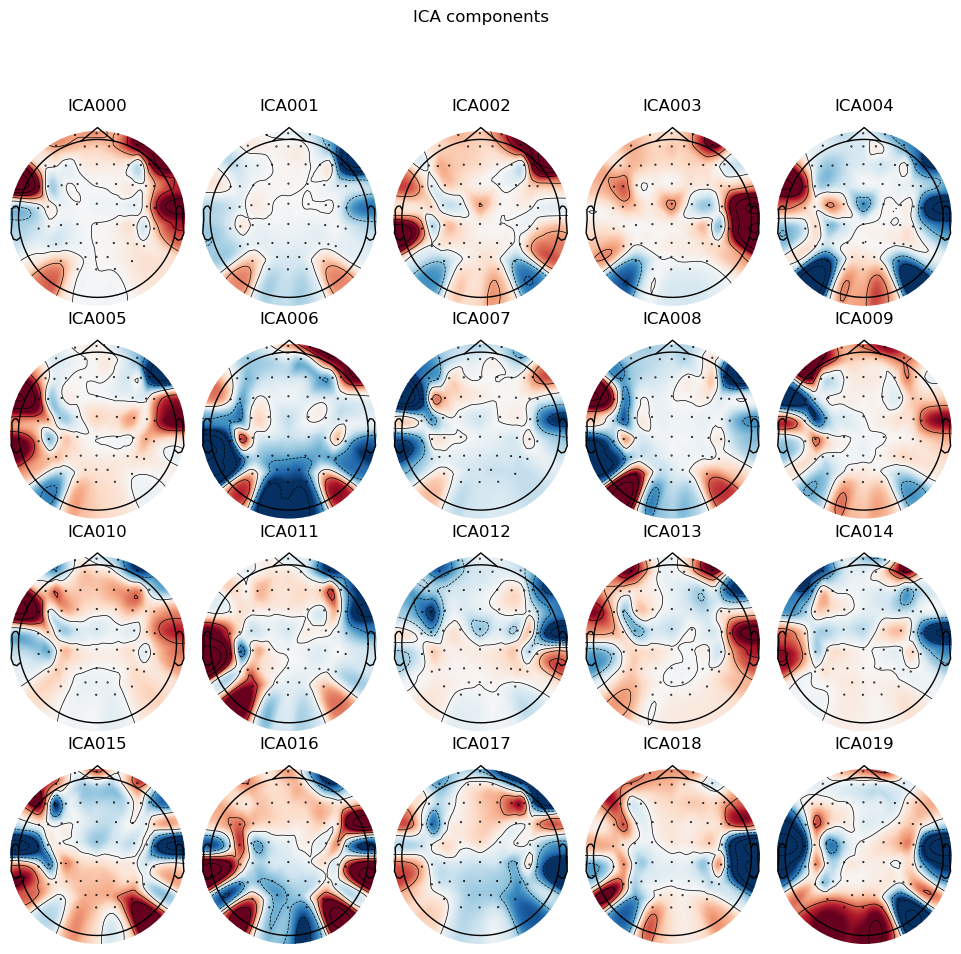

 For Band: Gamma
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 30 - 45 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 30.00, 45.00 Hz: -6.02, -6.02 dB

Effective window size : 1.000 (s)
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 0.0s.


C:\Users\Dedu\AppData\Local\Temp\ipykernel_14588\1430947192.py:40: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=256).
  plt.specgram(raw_band.get_data()[0], Fs=raw_band.info['sfreq'])
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


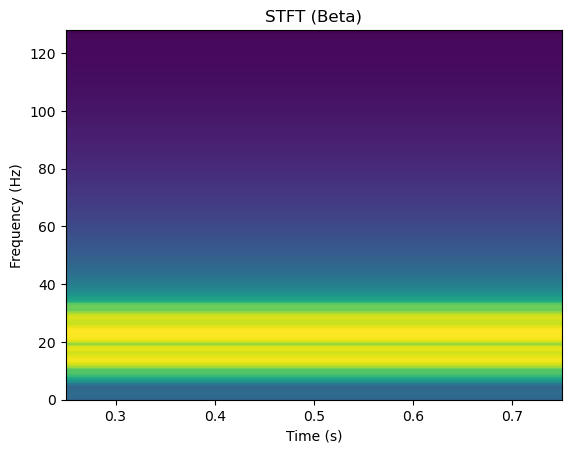

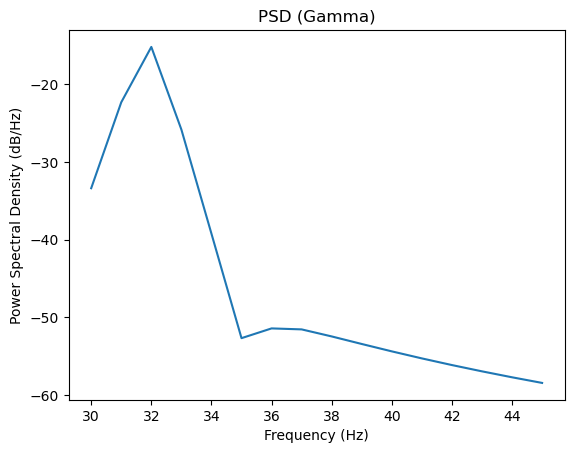

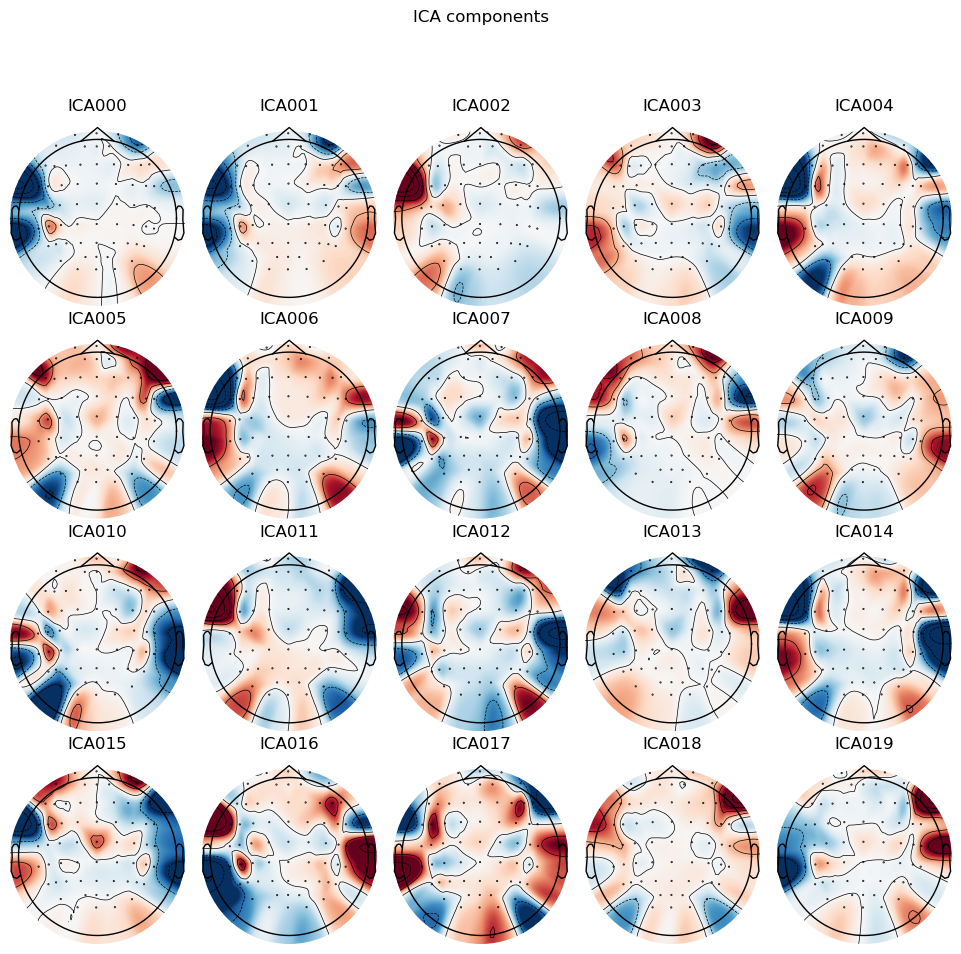

C:\Users\Dedu\AppData\Local\Temp\ipykernel_14588\1430947192.py:40: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=256).
  plt.specgram(raw_band.get_data()[0], Fs=raw_band.info['sfreq'])


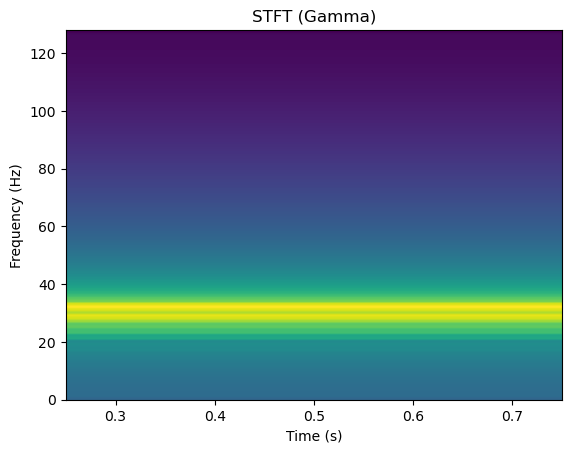

In [67]:
import mne
import numpy as np
import matplotlib.pyplot as plt

# Load the raw data
#raw = mne.io.read_raw_fif('data/raw.fif', preload=True)

# Define frequency bands of interest
freq_bands = {'Delta': (1, 4),
              'Theta': (4, 8),
              'Alpha': (8, 12),
              'Beta': (12, 30),
              'Gamma': (30, 45)}

# Loop through each frequency band
for band, (fmin, fmax) in freq_bands.items():
    # Filter the raw data to the frequency band of interest
    print(" For Band:",band)
    raw_band = raw.copy().filter(fmin, fmax, method='iir')

    # Calculate power spectral density
    psd, freqs = mne.time_frequency.psd_array_welch(raw_band.get_data()[0], sfreq=raw_band.info['sfreq'], fmin=fmin, fmax=fmax)

    # Plot PSD
    plt.figure()
    plt.plot(freqs, 10 * np.log10(psd))
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power Spectral Density (dB/Hz)')
    plt.title('PSD ({})'.format(band))

    # Calculate ICA
    ica = mne.preprocessing.ICA(n_components=20, random_state=42)
    ica.fit(raw_band)

    # Plot ICA
    ica.plot_components()

    # Plot STFT
    plt.figure()
    plt.specgram(raw_band.get_data()[0], Fs=raw_band.info['sfreq'])
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.title('STFT ({})'.format(band))

# Show all figures
plt.show()
